In [27]:
%config InlineBackend.figure_formats = {"retina", "png"}
%matplotlib inline

In [28]:
import os

os.environ["OPENBLAS_NUM_THREADS"] = "1"
import tempfile

from IPython.display import HTML, display
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import h5py

import tdgl
from tdgl.geometry import box, circle

In [29]:
solve_og = False
solve_layout = False
solve_fields = False
solve_radii = False
make_graphs = True
save_images = False

# Definición del dispositivo a usar

In [30]:
options_default_configs = {
    'skip_time': 100,
    'solve_time': 200,
    'field_units': "mT",
    "current_units": "uA",
}

In [31]:
length_units = "um"
image_path = "images"
raw_data_path = "raw_data"

coherence_length = 0.5
london_lambda = 2
d = 0.1
gamma = 1

layer = tdgl.Layer(london_lambda=london_lambda, coherence_length=coherence_length, thickness=d, gamma=gamma)

total_width = 15
total_length = 10
link_width = total_width / 3

x = total_width / 2
y = total_length / 2
points = [(-x, y), (-x + 4, y), (-x + 4, y - 1), (-x + 2, y - 3.5), (-x, y - 3.5), (-x, y)]
top_left_notch = (tdgl.Polygon(points=points))
bottom_left_notch = top_left_notch.scale(yfact=-1)

points = [(0,y), (x,y), (x, y - 3.5), (-1.0, y - 3.5), (-1.5, y - 3.0), (0, y - 1), (0,y)]
top_right_notch = (tdgl.Polygon(points=points))
bottom_right_notch = top_right_notch.scale(yfact=-1)

film = (
    tdgl.Polygon("film", points=box(total_width, total_length))
    .difference(top_left_notch, bottom_left_notch, top_right_notch, bottom_right_notch)
    .resample(401)
    .buffer(0)
)

radius = 1.9
hole = (
    tdgl.Polygon("hole", points=circle(radius=radius, center=(-3.3, 0)))
)

source = (
    tdgl.Polygon("source", points=box(0.2, 2))
    .translate(dx = -total_width / 2)
)

drain = source.scale(xfact=-1).set_name("drain")
#
probe_points = [(-6.5,0),(6.5,0)]


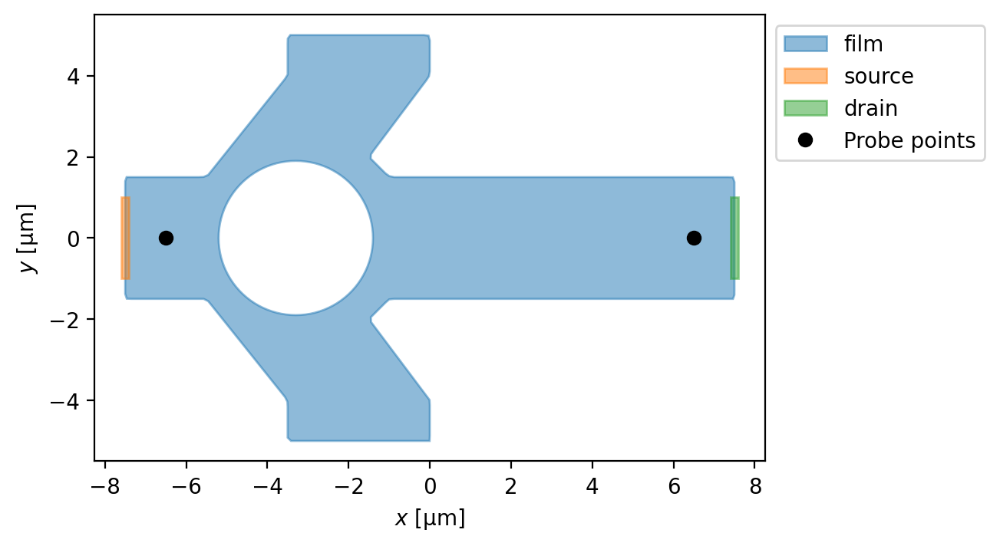

In [32]:
og_device = tdgl.Device(
    "original_device",
    layer=layer,
    film=film,
    holes=[hole],
    length_units=length_units,
    terminals=[source, drain],
    probe_points=probe_points,
)

fix, ax = og_device.draw()

Constructing Voronoi polygons: 100%|██████████| 3245/3245 [00:00<00:00, 10606.95it/s]


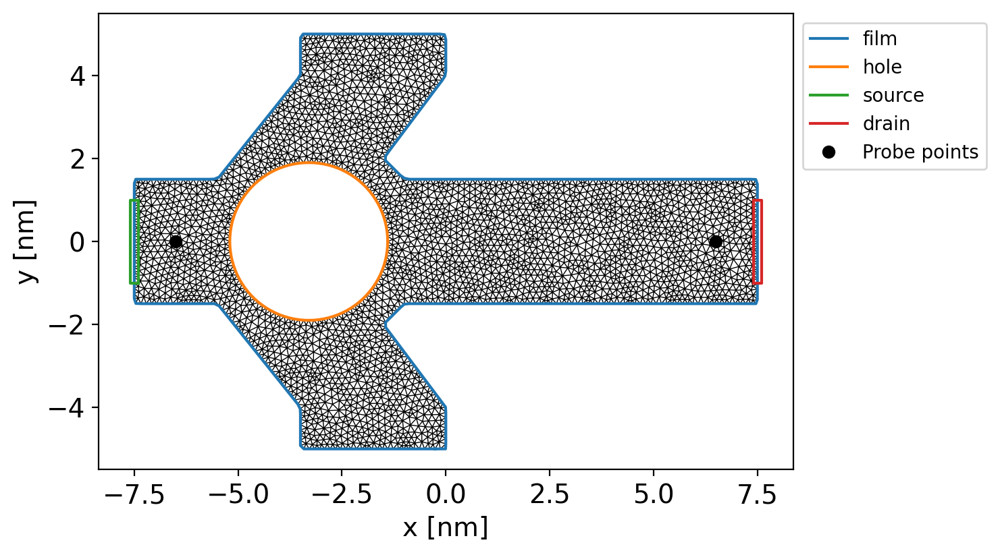

In [33]:
og_device.make_mesh(max_edge_length= coherence_length/2, smooth=100)

fig, ax = og_device.plot(mesh=True, legend=True, figsize=(9,4))

ax.set_xlabel("x [nm]",fontsize="14")
ax.set_ylabel("y [nm]",fontsize="14")
ax.tick_params(axis="both", labelsize=14)

# Gráfica de corrientes en el conductor

In [34]:
default_terminal_currents = {
    'source': 12,
    'drain' : -12
}

with tempfile.TemporaryDirectory(dir=os.getcwd()) as tmpdir:
    options = tdgl.SolverOptions(
        output_file = os.path.join(tmpdir, "current_field.h5"),
        **options_default_configs,
        save_every=100,
    )

    solution_without_field = tdgl.solve(device=og_device, options=options, terminal_currents=default_terminal_currents)

Simulating: 100%|█████████▉| 200/200 [00:33<00:00,  5.89tau/s ]


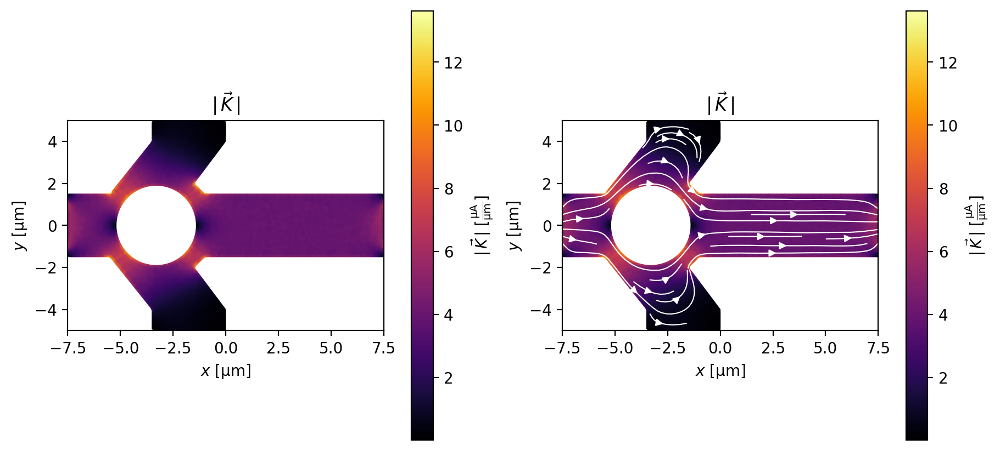

In [35]:
fig, axes = plt.subplots(1, 2, figsize=(9,4), constrained_layout=True)

_ = solution_without_field.plot_currents(ax=axes[0], streamplot=False)
_ = solution_without_field.plot_currents(ax=axes[1])


# Graphic V vs I

In [36]:
def get_mean_voltage(device, options, current):
    terminal_currents = {
        'source': current,
        'drain': -current,
    }

    solution = tdgl.solve(device=device, options=options, terminal_currents=terminal_currents)
    return solution.dynamics.mean_voltage()

In [37]:
voltage_current_save_file = "V_vs_I_conductor_"

In [38]:
if solve_og:
    currents = np.arange(0.0, 30, 0.1)
    p = os.path.join(raw_data_path, voltage_current_save_file + og_device.name + ".csv")
    
    if os.path.exists(p):
        os.remove(p)

    with tempfile.TemporaryDirectory(dir=os.getcwd()) as tmpdir:
        for current in currents:
            options = tdgl.SolverOptions(
                output_file = os.path.join(tmpdir, "current_field.h5"),
                **options_default_configs,
                save_every=100,
            )

            df = pd.DataFrame({'current_uA': [current], 'voltage_V': [get_mean_voltage(og_device, options, current)]})
            df.to_csv(p, mode='a', header=not os.path.exists(p), index=False)

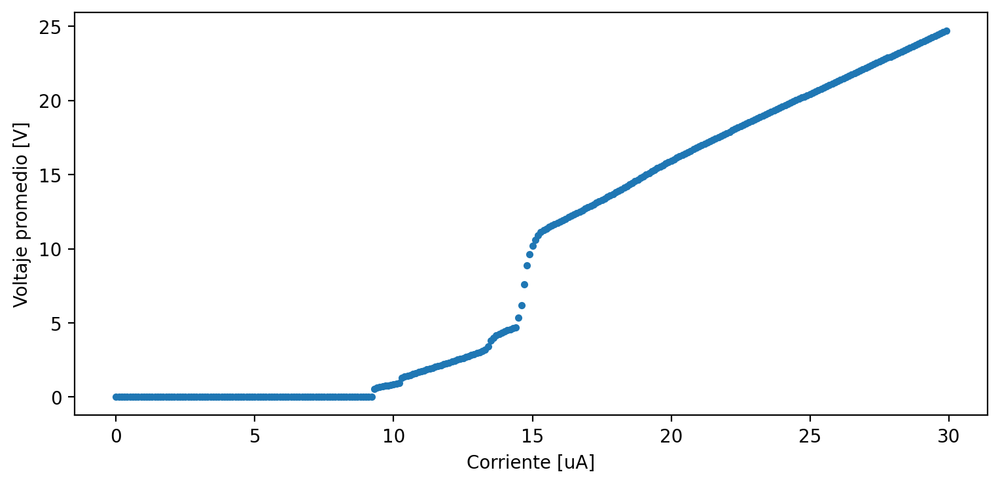

In [39]:
if make_graphs:
    og_device_raw_data = pd.read_csv(os.path.join(raw_data_path, voltage_current_save_file + og_device.name + ".csv")).to_numpy()
    
    fig = plt.figure(figsize=(9,4))
    plt.plot([d[0] for d in og_device_raw_data], [d[1] for d in og_device_raw_data], ".")
    plt.xlabel('Corriente [uA]')
    plt.ylabel('Voltaje promedio [V]')
    fig.savefig(os.path.join(image_path, "v-vs-i.pdf"))
    plt.show()

# Current in multiple Source - Drain configurations

In [40]:
devices = []

left_source = source = (
    tdgl.Polygon("source", points=box(0.2, 2))
    .translate(dx = -total_width / 2)
)

right_drain = left_source.scale(xfact=-1).set_name('drain')

top_source = (
    tdgl.Polygon("source", points=box(2, 0.2))
    .translate(dy = total_length / 2, dx = -1.8)
)

devices_names = {
    'ltr': "Left to right",
    'ttb': "Top to bottom",
    'ltb': "Left to bottom",
    'ttr': "Top to right"
}

bot_drain = top_source.scale(yfact=-1).set_name('drain')

top_probe = (-1.8, 4)
bot_probe = (-1.8, -4)
left_probe = (-6.5, 0)
right_probe = (6.5, 0)

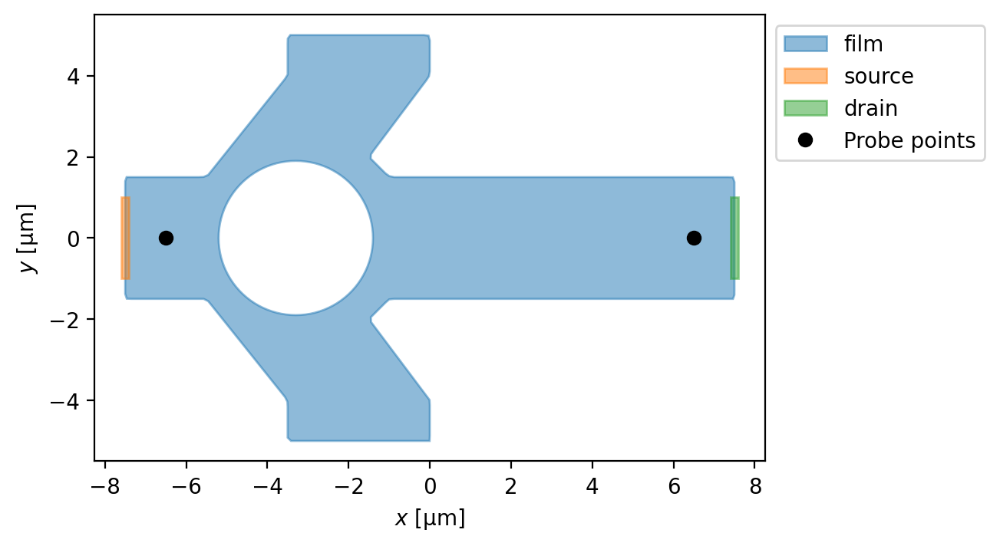

In [41]:
ltr_device = tdgl.Device(
    "ltr",
    layer=layer,
    film=film,
    holes=[hole],
    length_units=length_units,
    terminals=[left_source, right_drain],
    probe_points=[left_probe, right_probe],
)

devices.append(ltr_device) if ltr_device not in devices else None

fix, ax = ltr_device.draw()

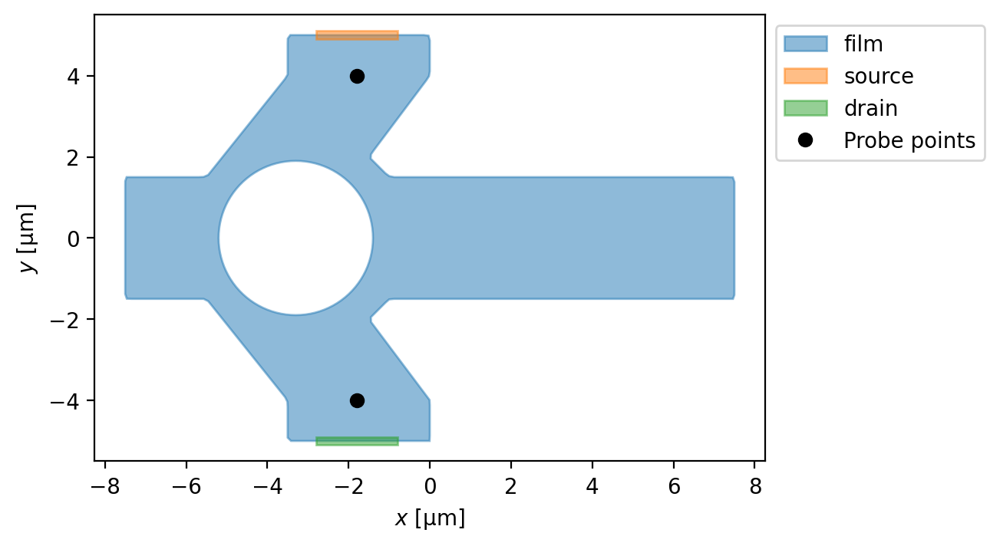

In [42]:
ttb_device = tdgl.Device(
    "ttb",
    layer=layer,
    film=film,
    holes=[hole],
    length_units=length_units,
    terminals=[top_source, bot_drain],
    probe_points=[top_probe, bot_probe],
)

devices.append(ttb_device) if ttb_device not in devices else None

fix, ax = ttb_device.draw()

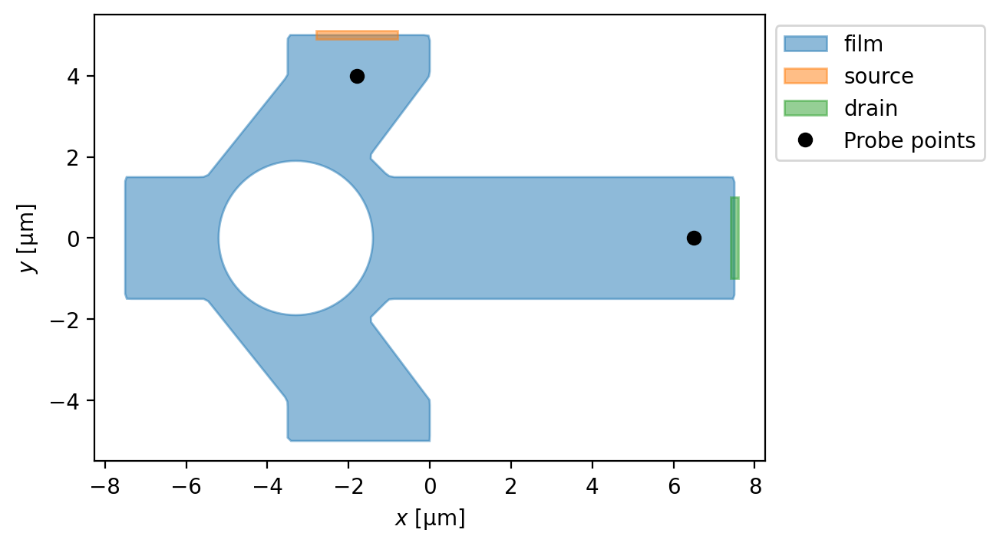

In [43]:
ttr_device = tdgl.Device(
    "ttr",
    layer=layer,
    film=film,
    holes=[hole],
    length_units=length_units,
    terminals=[top_source, right_drain],
    probe_points=[top_probe, right_probe],
)

devices.append(ttr_device) if ttr_device not in devices else None

fix, ax = ttr_device.draw()

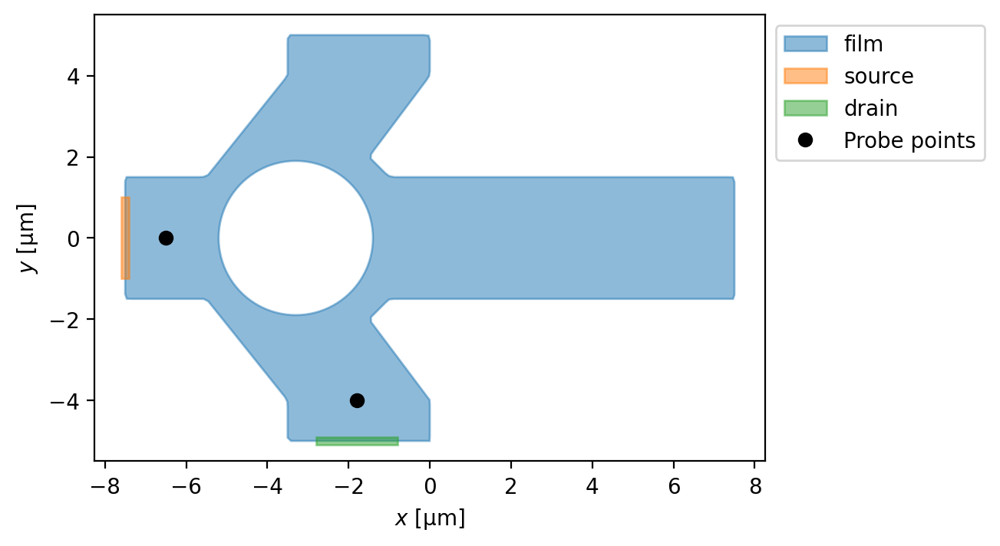

In [44]:
ltb_device = tdgl.Device(
    "ltb",
    layer=layer,
    film=film,
    holes=[hole],
    length_units=length_units,
    terminals=[left_source, bot_drain],
    probe_points=[left_probe, bot_probe],
)

devices.append(ltb_device) if ltb_device not in devices else None

fix, ax = ltb_device.draw()

Constructing Voronoi polygons: 100%|██████████| 3245/3245 [00:00<00:00, 10262.42it/s]


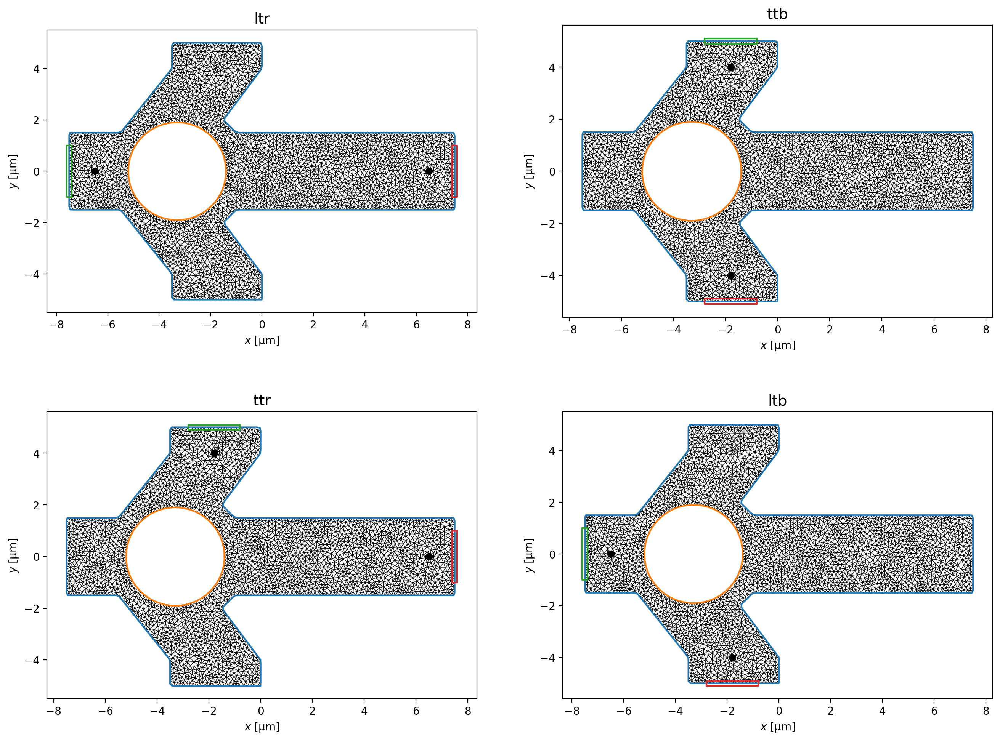

In [45]:
plt.figure(figsize=(16, 12))

if len(devices) == 4:
    for i, d in enumerate(devices):
        d.make_mesh(max_edge_length=coherence_length/2, smooth=100)
        
        ax = plt.subplot(2, 2, i + 1)
        fig, _ = d.plot(mesh=True, legend=False, ax=ax)
    
        ax.set_title(f"{d.name}", fontsize=14)

Simulating: 100%|█████████▉| 200/200 [00:32<00:00,  6.20tau/s ]


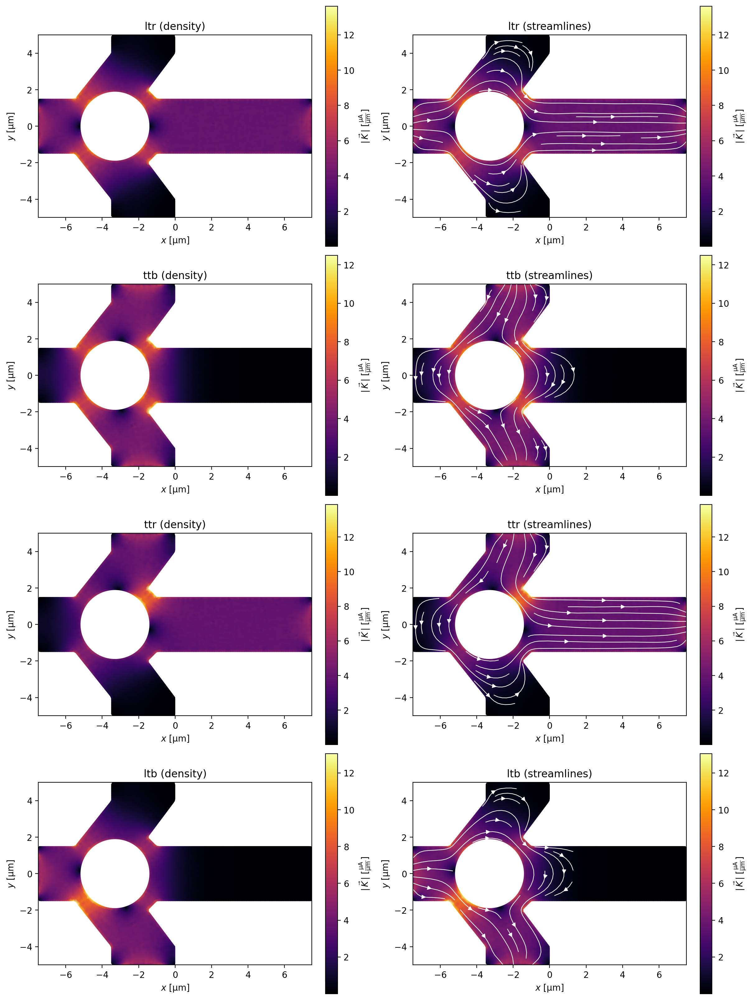

In [46]:
default_terminal_currents = {
    'source': 12,
    'drain': -12
}


fig, axes = plt.subplots(len(devices), 2, figsize=(12, 4*len(devices)), constrained_layout=True)

for i, d in enumerate(devices):
    with tempfile.TemporaryDirectory(dir=os.getcwd()) as tmpdir:
        options = tdgl.SolverOptions(
            output_file = os.path.join(tmpdir, "current_field.h5"),
            **options_default_configs,
        )
        solve = tdgl.solve(device=d, options=options, terminal_currents=default_terminal_currents)

        solve.plot_currents(ax=axes[i, 0], streamplot=False)
        axes[i, 0].set_title(f"{d.name} (density)", fontsize=12)

        solve.plot_currents(ax=axes[i, 1], streamplot=True)
        axes[i, 1].set_title(f"{d.name} (streamlines)", fontsize=12)

# Gráfica V vs I para cada layout

In [47]:
csv_prefix = "V_vs_I_layout"

def get_v_vs_i_for_device(d, current):
    with tempfile.TemporaryDirectory(dir=os.getcwd()) as tmpdir:
        options = tdgl.SolverOptions(
            output_file = os.path.join(tmpdir, "current_field.h5"),
            **options_default_configs,
        )

        path = os.path.join(raw_data_path, f"{csv_prefix}_{d.name}.csv")
        if os.path.exists(path):
            os.remove(path)

        for current in currents:
            df = pd.DataFrame({'current_uA': [current], 'voltage_V': [get_mean_voltage(d, options, current)]})
            df.to_csv(path, mode='a', header=not os.path.exists(path), index=False)

In [48]:
currents = np.arange(0.0, 30.0, 0.1)

In [49]:
if solve_layout:
    for device in devices:
        get_v_vs_i_for_device(device, current=currents)

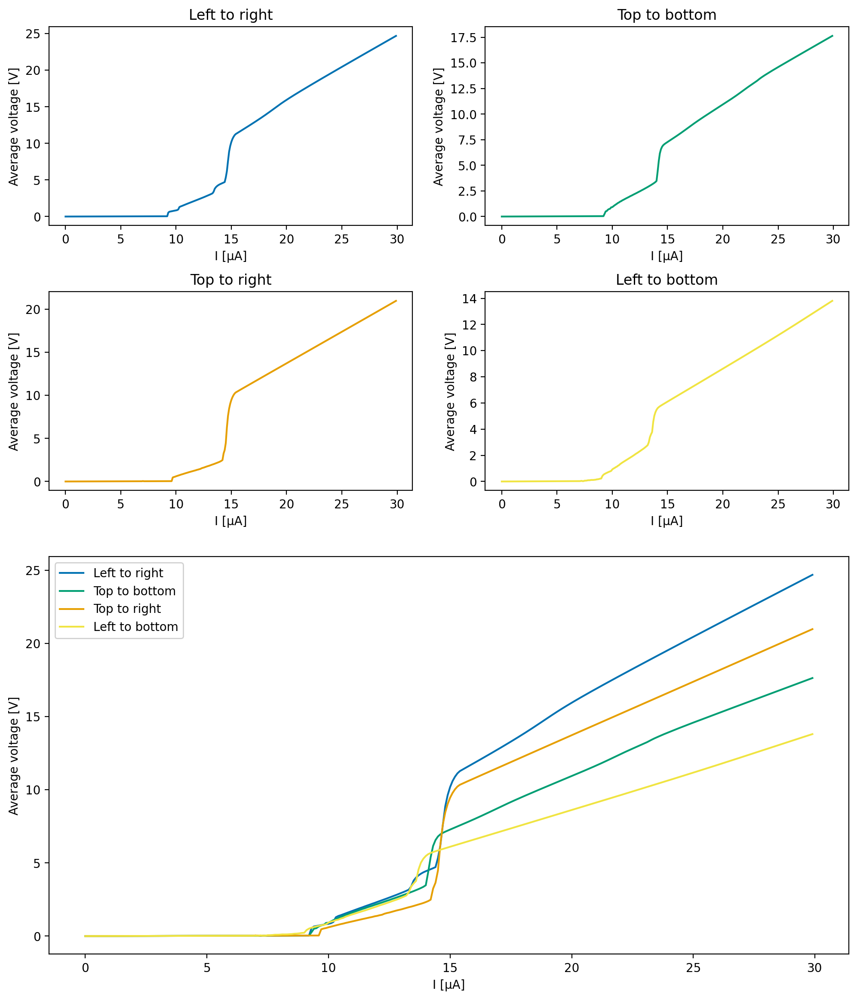

In [50]:
if make_graphs:
    csv_prefix = "V_vs_I_layout"
    graph_data = {}

    for device in devices:
        graph_data[device.name] = pd.read_csv(os.path.join(raw_data_path, f"{csv_prefix}_{device.name}.csv")).to_numpy()

    fig = plt.figure(figsize=(12,14))

    colors = {
        "ltr": "#0072B2",
        "ttb": "#009E73",
        "ttr": "#E69F00",
        "ltb": "#F0E442"
    }

    plot_configs = {
        "linestyle": "-",
        "linewidth": 1.5
    }
    
    total_rows = (len(devices) + 1)//2 + 1
    
    gs = fig.add_gridspec(total_rows, 2, height_ratios=[1,1,2], hspace=0.25)
    
    for i in range(total_rows-1):
        for j in range(2):
            d = devices[i * 2 + j]
            name = d.name
            raw_data = graph_data[name]
    
            ax = fig.add_subplot(gs[i, j])
            ax.plot(
                [i[0] for i in raw_data],
                [v[1] for v in raw_data],
                color=colors[name],
                **plot_configs
            )
            ax.set_title(devices_names[name])
            ax.set_xlabel("I [µA]")
            ax.set_ylabel("Average voltage [V]")
    
    ax_big = fig.add_subplot(gs[2, :])
    
    for d in devices:
        name = d.name
        raw_data = graph_data[name]
    
        ax_big.plot(
            [i[0] for i in raw_data],
            [v[1] for v in raw_data],
            label=devices_names[name],
            color=colors[name],
            **plot_configs,
        )
    
    ax_big.set_xlabel("I [µA]")
    ax_big.set_ylabel("Average voltage [V]")
    ax_big.legend(loc="upper left", framealpha=0.9)
    
    if save_images:
        image_name = "v_vs_i_layout.pdf"
        p = os.path.join(image_path, image_name)
        os.makedirs(os.path.dirname(p), exist_ok=True)
        fig.savefig(p)
    
    plt.show()

# Gráfica V vs I $H \neq 0$

In [51]:
selected_devices = [ltr_device,]

In [52]:
applied_fields = [0.0, 0.2, 0.4, 0.6, 0.8, 1.0]
currents = np.arange(0.0, 30.0, 0.1)
csv_prefix_field = "V_vs_I_fields"

if solve_fields:
    for device in selected_devices:
        with tempfile.TemporaryDirectory(dir=os.getcwd()) as tmpdir:
            for field in applied_fields:
                options = tdgl.SolverOptions(
                    solve_time=200,
                    output_file=os.path.join(tmpdir, "non-zero-field.h5"),
                    field_units="mT",
                    current_units="uA",
                )
                zero_current_solution = tdgl.solve(
                    device=device,
                    options=options,
                    applied_vector_potential=field,
                )
    
                
                p = os.path.join(raw_data_path, f"{csv_prefix_field}_{field}_{device.name}.csv")
                if os.path.exists(p):
                    os.remove(p)
                    
                for current in currents:
                    current_options = tdgl.SolverOptions(
                        output_file=os.path.join(tmpdir, "non-zero-field.h5"),
                        **options_default_configs,
                    )

                    field_current_solution = tdgl.solve(
                        device=device,
                        options=current_options,
                        applied_vector_potential=field,
                        terminal_currents={
                            'source': current,
                            'drain': -current,
                        },
                        seed_solution=zero_current_solution,
                    )

                    df = pd.DataFrame({'current_uA': [current], 'voltage_V': [field_current_solution.dynamics.mean_voltage()]})
                    df.to_csv(p, mode='a', header=not os.path.exists(p), index=False)

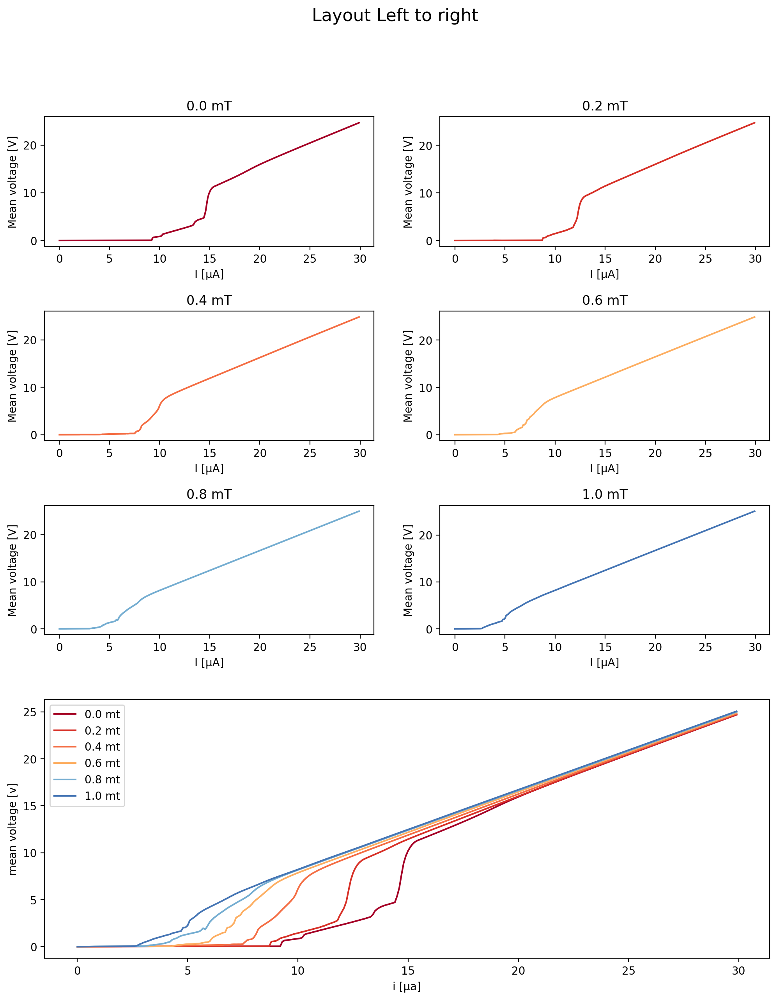

In [53]:
if make_graphs:
    graph_data = {}

    colors = {
        0.0: '#a50026',
        0.2: '#d73027',
        0.4: '#f46d43',
        0.6: '#fdae61',
        0.8: '#74add1',
        1.0: '#4575b4',
    }

    plot_configs = {
        "linestyle": "-",
        "linewidth": 1.5
    }

    for device in selected_devices:
        device_data = {}
        for field in applied_fields:
            raw_data = pd.read_csv(os.path.join(raw_data_path, f"{csv_prefix_field}_{field}_{device.name}.csv")).to_numpy()

            device_data[field] = {
                'v': [v[1] for v in raw_data],
                'i': [i[0] for i in raw_data],
            }
            

        graph_data[device.name] = device_data

    for device in selected_devices:
        fig = plt.figure(figsize=(12, 14))
        fig.suptitle(f"Layout {devices_names[device.name]}", fontsize=16)
        NROWS = (len(applied_fields) + 1)//2
        total_rows = NROWS + 1
        data_to_plot = graph_data[device.name]

        gs = fig.add_gridspec(total_rows, 2, height_ratios=[1]*NROWS + [2], hspace=0.4)

        for i in range(NROWS):
            for j in range(2):
                field = applied_fields[i * 2 + j]
                ax = fig.add_subplot(gs[i, j])
                ax.plot(data_to_plot[field]['i'], data_to_plot[field]['v'], color=colors[field], **plot_configs)
                ax.set_title(f"{field} mT")
                ax.set_xlabel("I [µA]")
                ax.set_ylabel("Mean voltage [V]")

        ax_big = fig.add_subplot(gs[NROWS,:])
        for f in applied_fields:
            ax_big.plot(data_to_plot[f]['i'], data_to_plot[f]['v'], label=f"{f} mt", color=colors[f], **plot_configs)

        ax_big.set_xlabel("i [µa]")
        ax_big.set_ylabel("mean voltage [v]")
        ax_big.legend()

        if save_images:
            image_name = "v_vs_i_fields.pdf"
            p = os.path.join(image_path, image_name)
            os.makedirs(os.path.dirname(p), exist_ok=True)
            fig.savefig(p)

        plt.show()

# V vs I cambiando el radio de la deformidad


## Definición de los devices


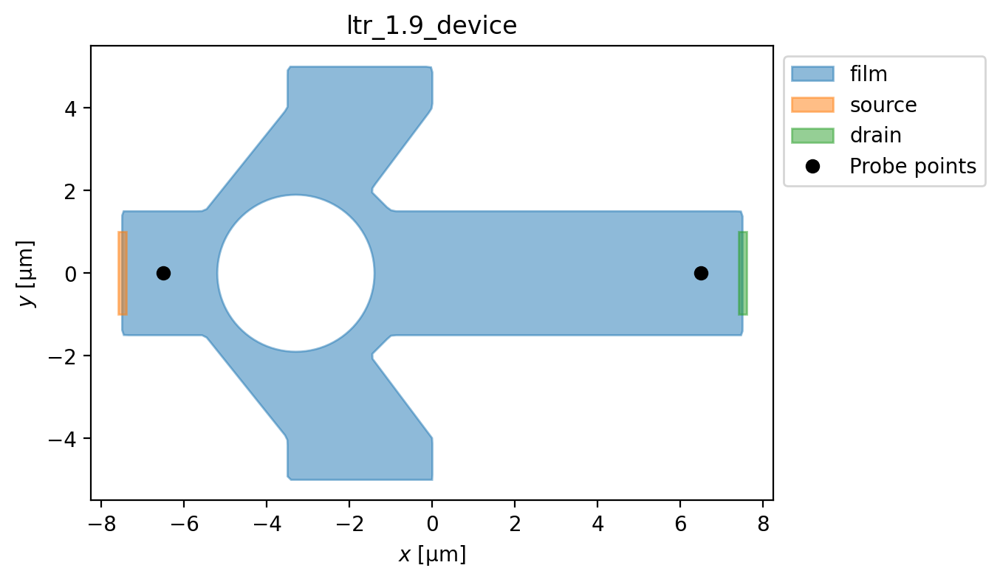

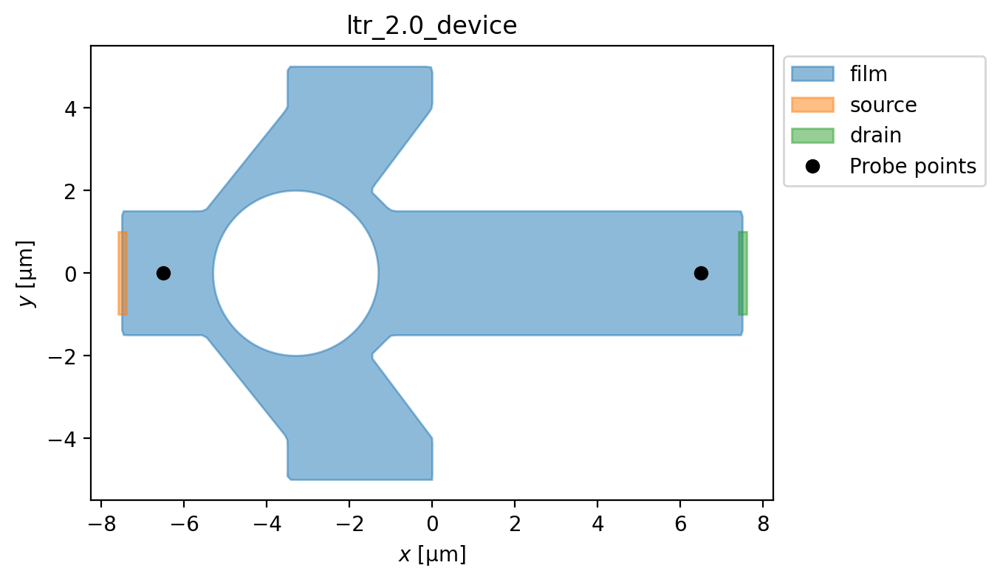

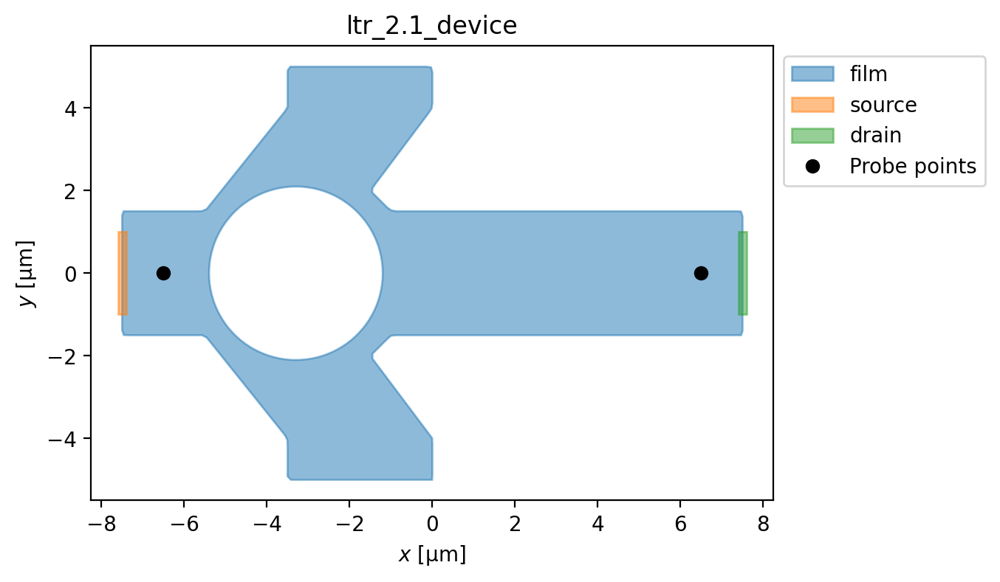

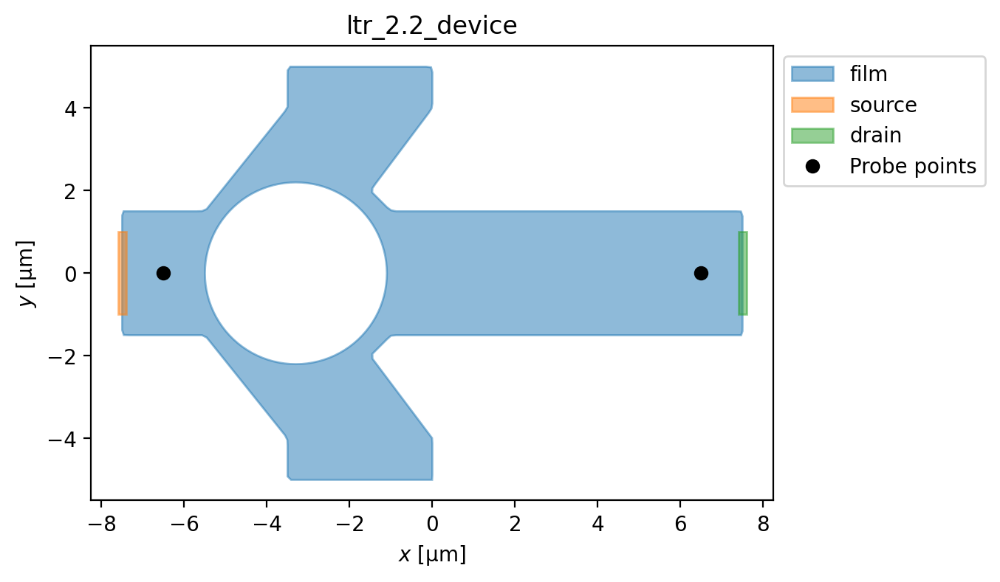

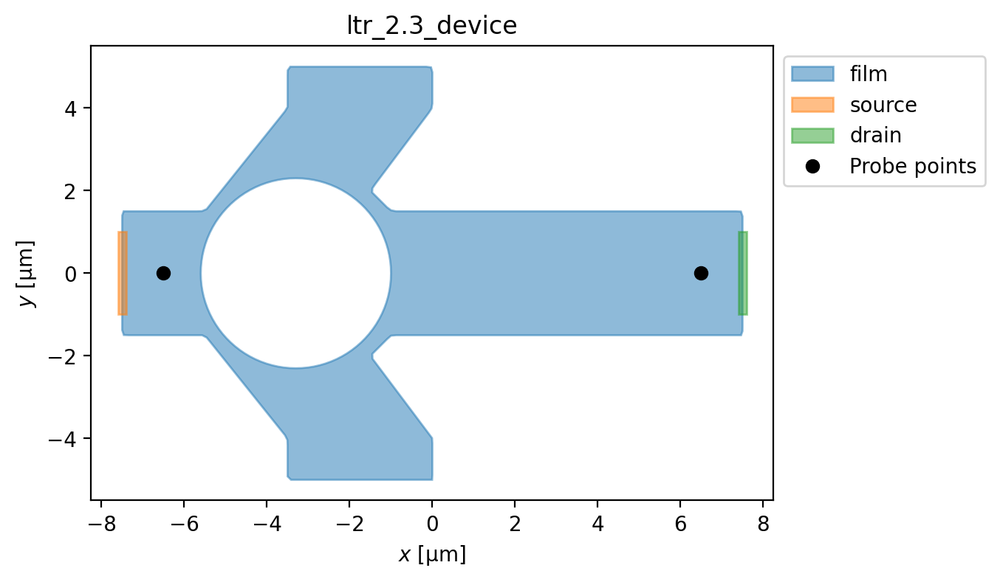

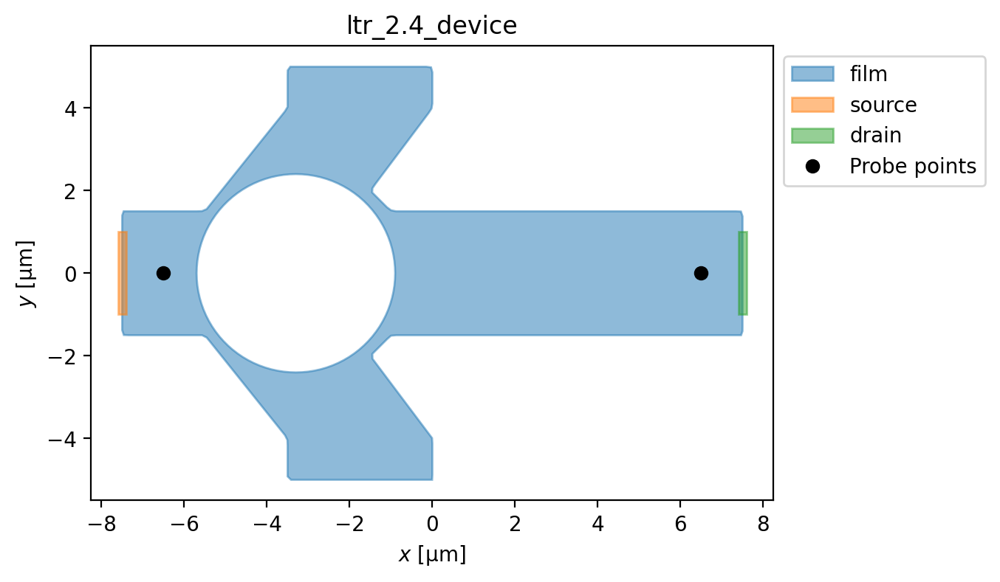

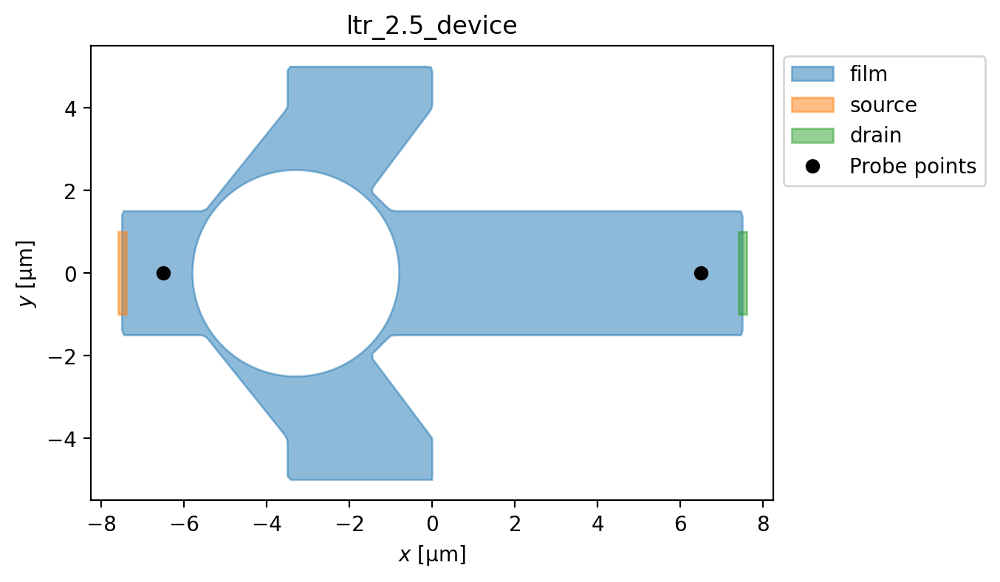

In [54]:
radii = [1.9, 2.0, 2.1, 2.2, 2.3, 2.4, 2.5]

def get_device(name, hole, probe_points):
    return tdgl.Device(
        name,
        layer=layer,
        film=film,
        holes=[hole],
        length_units=length_units,
        terminals=[source, drain],
        probe_points=probe_points,
    )

devices_to_use = {
    'ltr': {
        'probe_points': [left_probe, right_probe],
        'devices': [],
    }
}

devices = []
for k, v in devices_to_use.items():
    for r in radii:
        hole = (
            tdgl.Polygon("hole", points=circle(radius=r, center=(-3.3, 0)))
        )
        devices.append(
            get_device(
                name=f"{k}_{r}_device",
                probe_points=v["probe_points"],
                hole=hole,
            ),
        )
        v['devices'] = devices


for v in devices_to_use.values():
    for d in v['devices']:
        fig, ax = plt.subplots(1, 1, figsize=(9,4))
        ax.set_title(d.name)
        fig, ax = d.draw(ax=ax)

Constructing Voronoi polygons: 100%|██████████| 3245/3245 [00:00<00:00, 11063.46it/s]


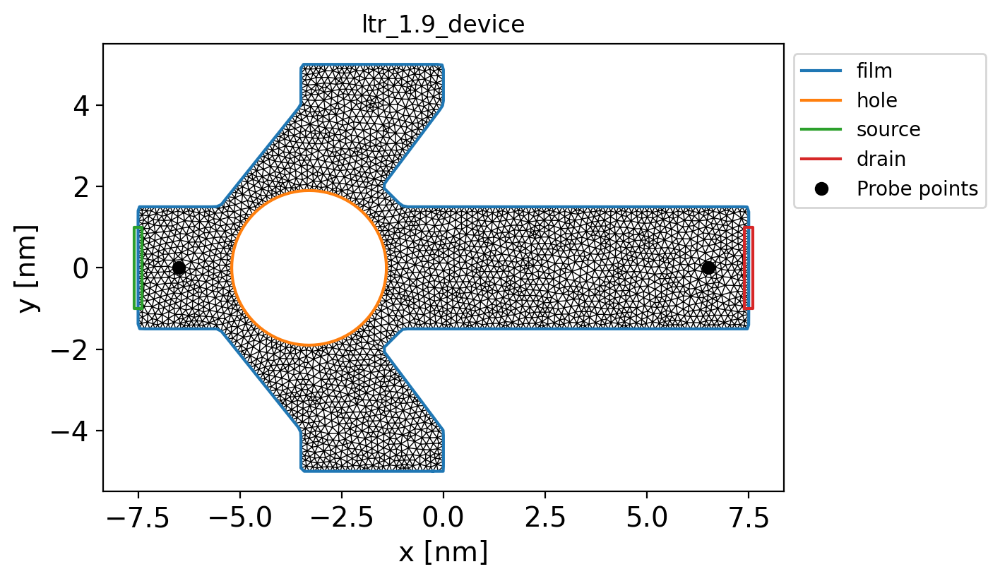

Constructing Voronoi polygons: 100%|██████████| 3234/3234 [00:00<00:00, 11912.26it/s]


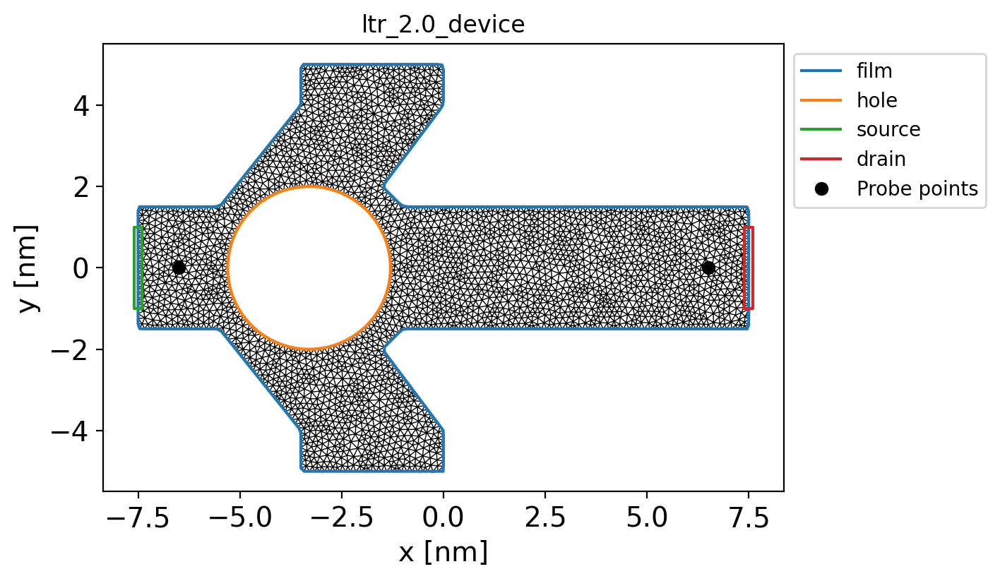

Constructing Voronoi polygons: 100%|██████████| 3232/3232 [00:00<00:00, 11125.66it/s]


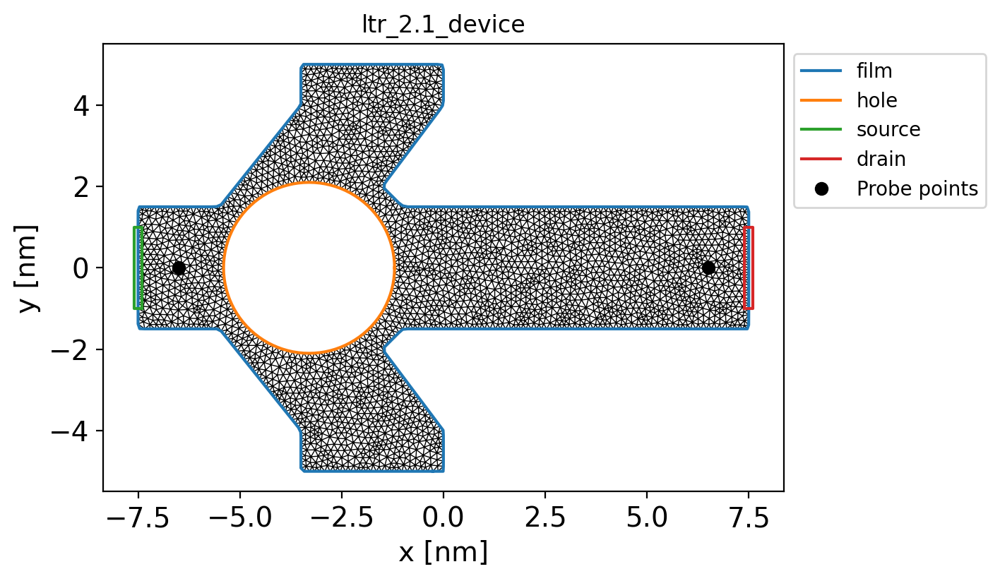

Constructing Voronoi polygons: 100%|██████████| 3163/3163 [00:00<00:00, 11261.67it/s]


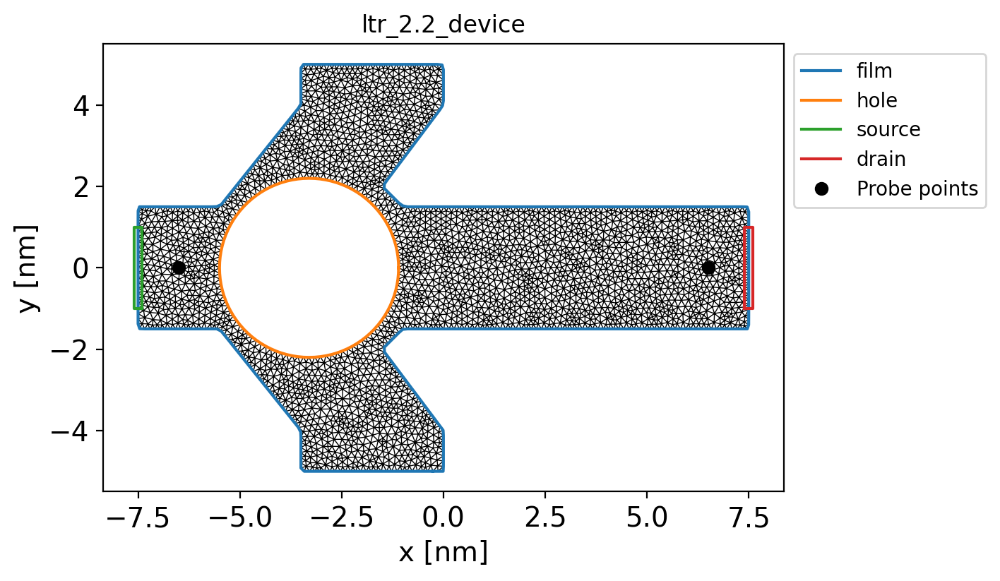

Constructing Voronoi polygons: 100%|██████████| 2975/2975 [00:00<00:00, 11804.72it/s]


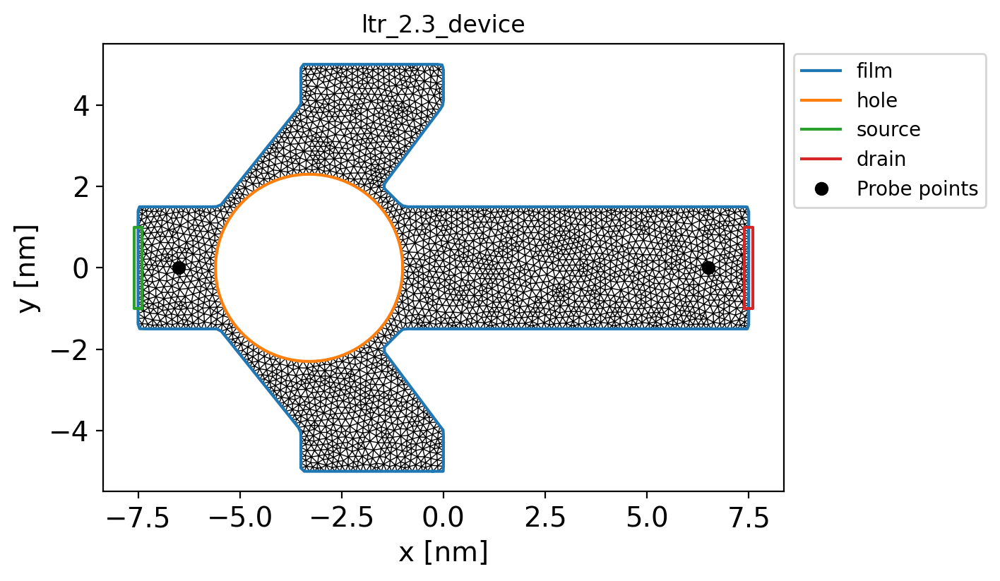

Constructing Voronoi polygons: 100%|██████████| 3016/3016 [00:00<00:00, 11925.13it/s]


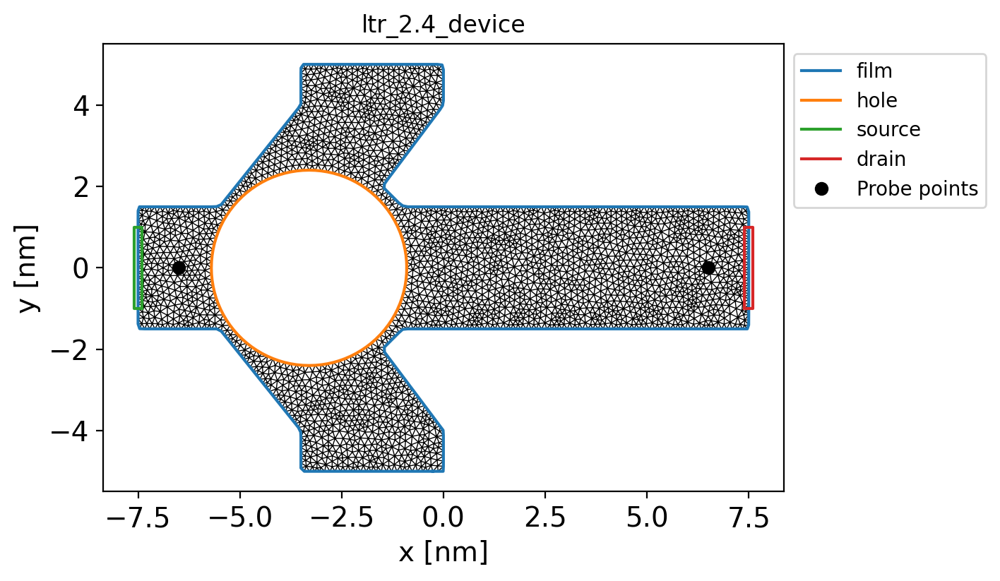

Constructing Voronoi polygons: 100%|██████████| 2831/2831 [00:00<00:00, 11781.33it/s]


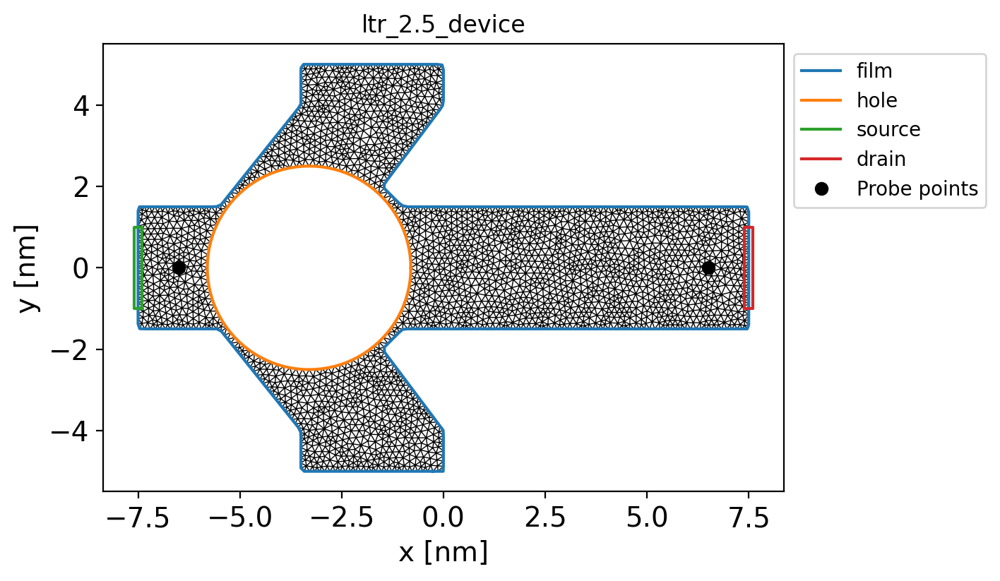

In [55]:
for v in devices_to_use.values():
    for d in v['devices']:
        d.make_mesh(max_edge_length=coherence_length/2, smooth=100)

        fig, ax = d.plot(mesh=True, figsize=(9,4))

        ax.set_title(d.name)
        ax.set_xlabel("x [nm]",fontsize="14")
        ax.set_ylabel("y [nm]",fontsize="14")
        ax.tick_params(axis="both", labelsize=14)

        plt.show()

## Gráfica de corrientes

Simulating: 100%|█████████▉| 200/200 [00:33<00:00,  6.03tau/s ]


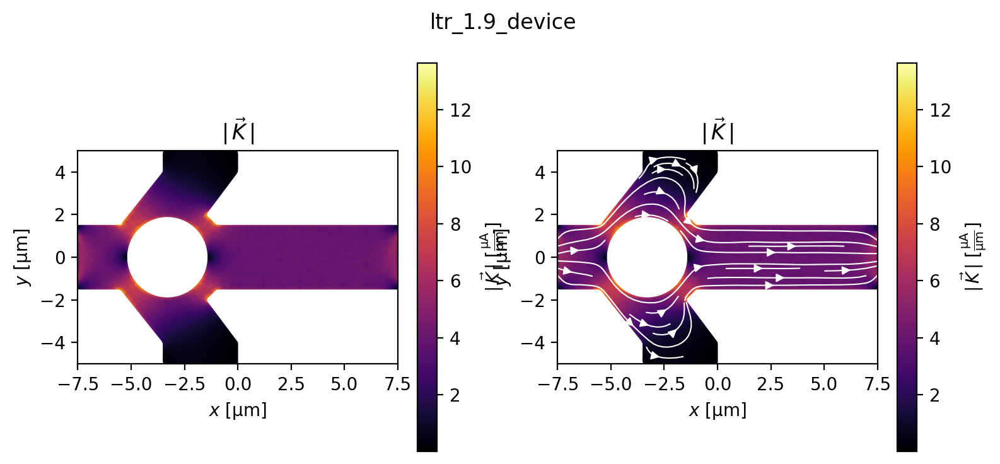

Simulating: 100%|█████████▉| 200/200 [00:28<00:00,  6.93tau/s ]


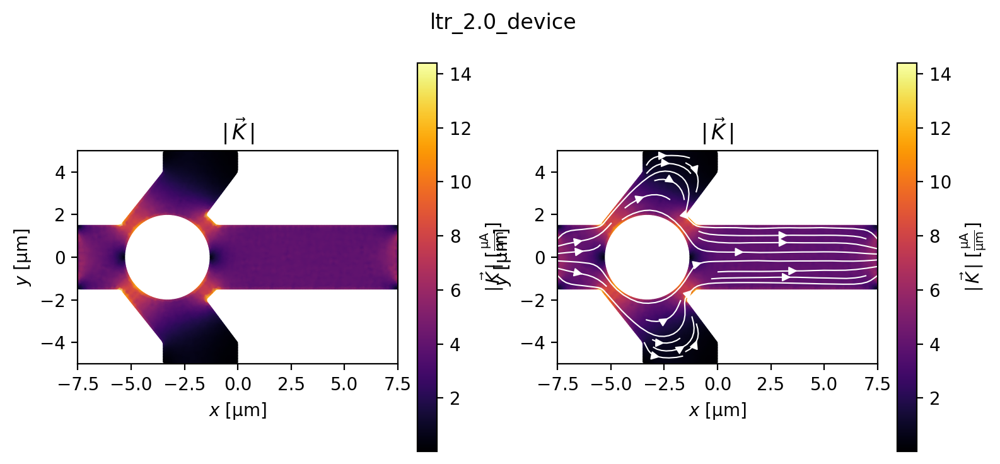

Simulating: 100%|█████████▉| 200/200 [00:32<00:00,  6.17tau/s ]


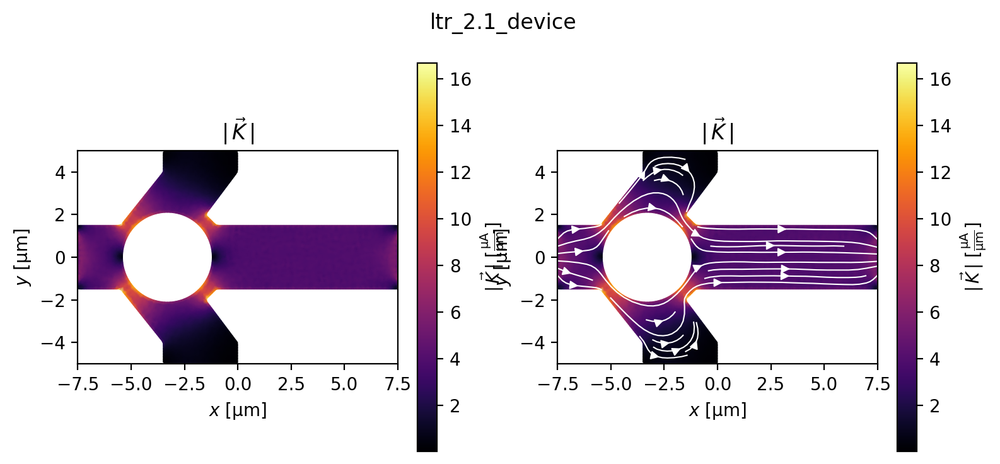

Simulating: 100%|█████████▉| 200/200 [00:29<00:00,  6.82tau/s ]


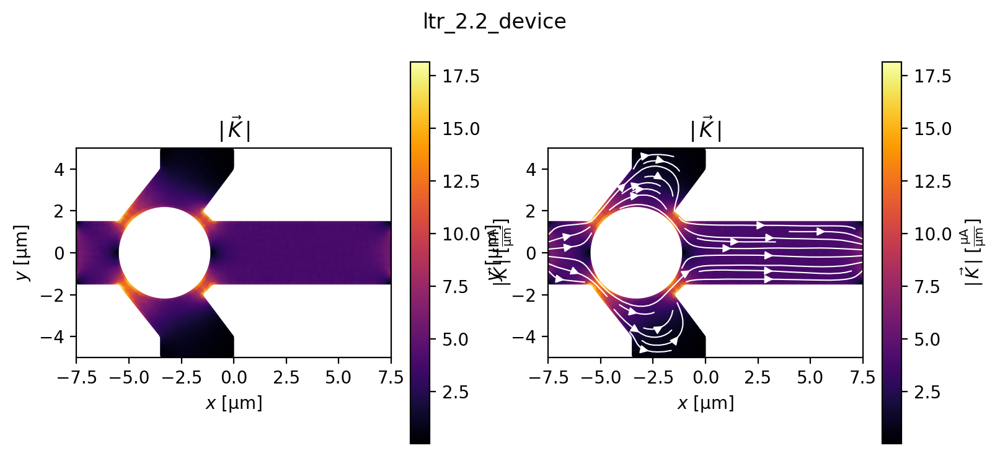

Simulating: 100%|█████████▉| 200/200 [00:27<00:00,  7.15tau/s ]


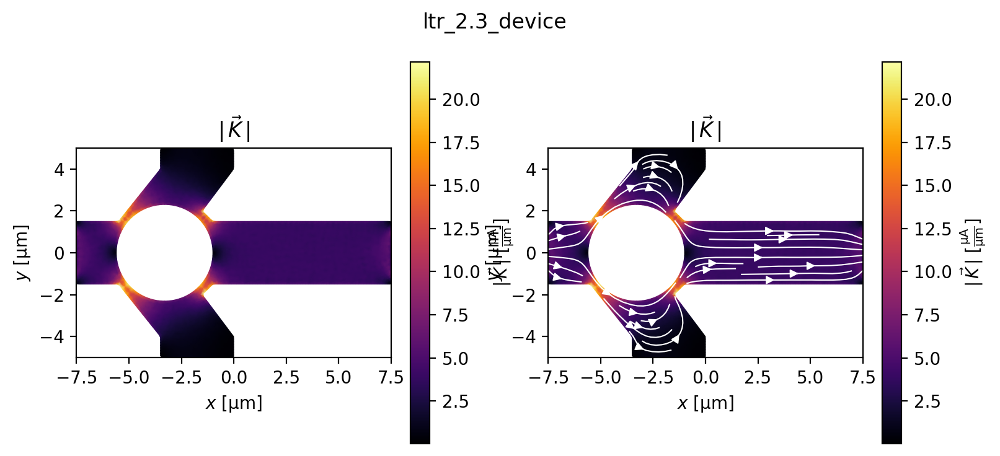

Simulating: 100%|█████████▉| 200/200 [00:22<00:00,  8.71tau/s ]


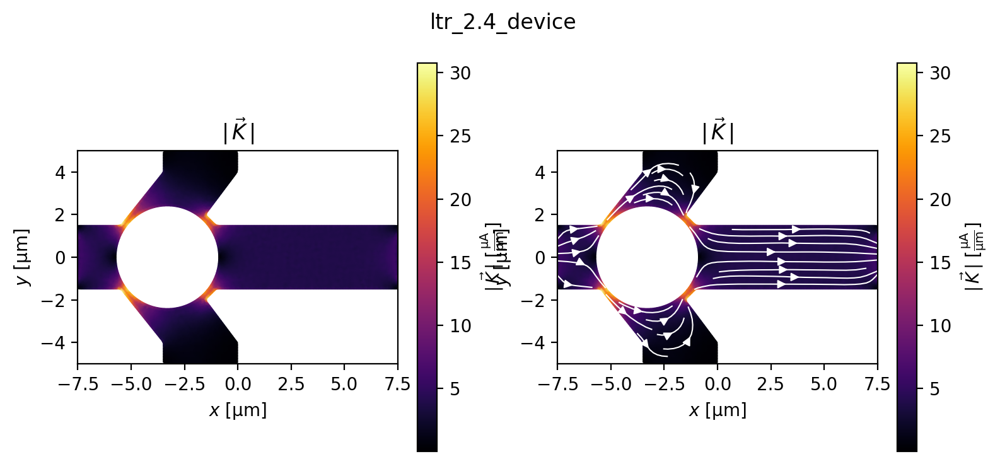

Simulating: 100%|█████████▉| 200/200 [00:20<00:00,  9.56tau/s ]


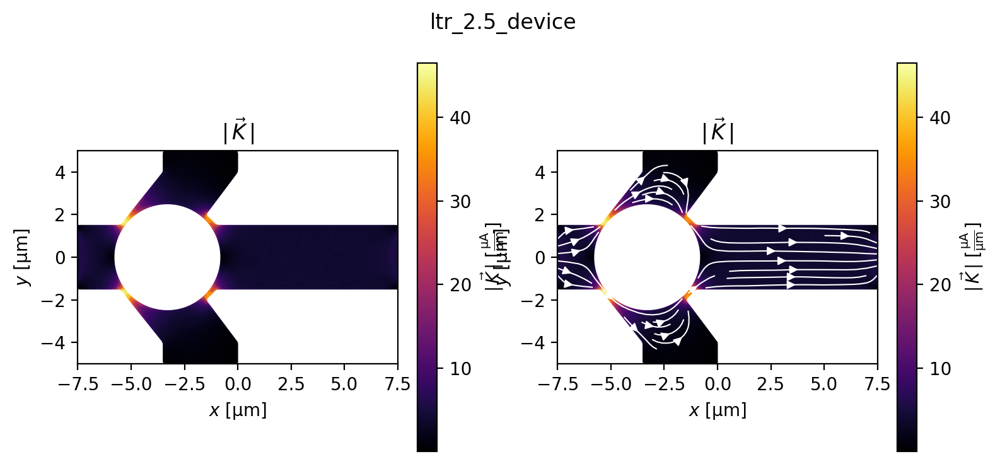

In [56]:
default_terminal_currents = {
    'source': 12,
    'drain': -12,
}

for v in devices_to_use.values():
    for d in v['devices']:
        with tempfile.TemporaryDirectory(dir=os.getcwd()) as tmpdir:
            options = tdgl.SolverOptions(
                output_file=os.path.join(tmpdir, f"current_radii.h5"),
                **options_default_configs,
            )

            solution = tdgl.solve(device=d, options=options, terminal_currents=default_terminal_currents)

            fig, axes = plt.subplots(1, 2, figsize=(9, 4))
            fig.suptitle(d.name)

            _ = solution.plot_currents(ax=axes[0], streamplot=False)
            _ = solution.plot_currents(ax=axes[1])

            plt.show()


## Gráficas de V vs I

In [57]:
csv_prefix = "V_vs_I_radii"

if solve_radii:
    currents = np.arange(0.0, 30.0, 0.1)

    for v in devices_to_use.values():
        for d in v['devices']:
            with tempfile.TemporaryDirectory(dir=os.getcwd()) as tmpdir:
                options = tdgl.SolverOptions(
                    output_file=os.path.join(tmpdir, "current_radii.h5"),
                    **options_default_configs,
                )

                path_to_csv = os.path.join(raw_data_path, f"{csv_prefix}_{d.name}.csv")
                if os.path.exists(path_to_csv):
                    os.remove(path_to_csv)

                for current in currents:
                    solution = tdgl.solve(
                        device=d,
                        options=options,
                        terminal_currents={
                            'source': current,
                            'drain': -current,
                        },
                    )

                    df = pd.DataFrame({
                        'current_uA': [current],
                        'voltage_V': [solution.dynamics.mean_voltage()]
                    }).to_csv(path_to_csv, mode='a', header=not os.path.exists(path_to_csv), index=False)

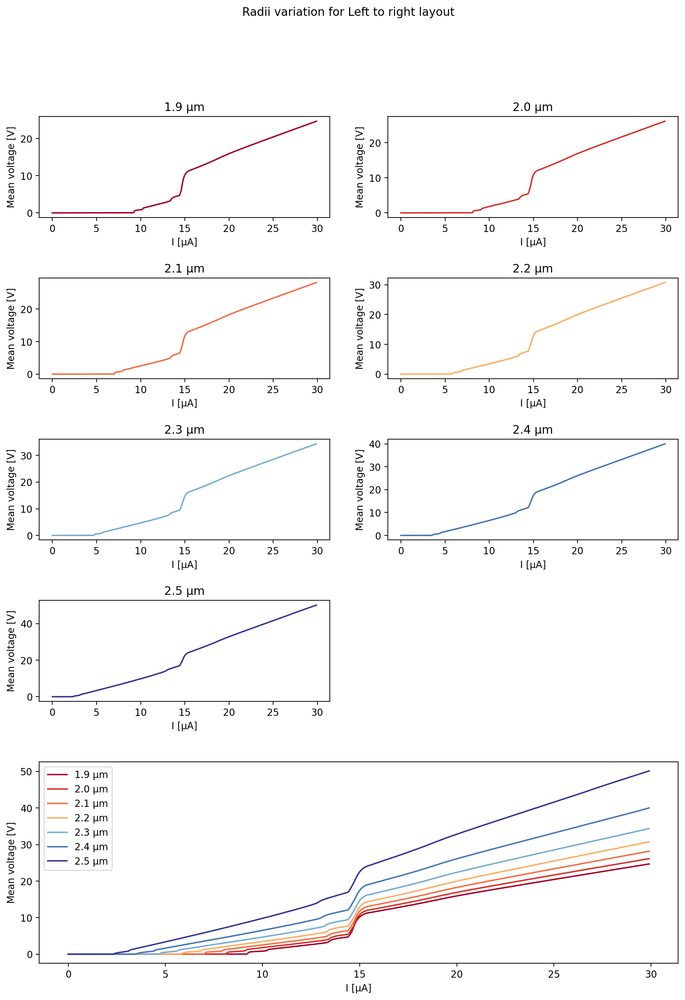

In [58]:
if make_graphs:
    def get_radii_by_name(device_name):
        return device_name.split("_")[1]

    graph_data = {}


    colors = {
        '1.9': '#a50026',
        '2.0': '#d73027',
        '2.1': '#f46d43',
        '2.2': '#fdae61',
        '2.3': '#74add1',
        '2.4': '#4575b4',
        '2.5': '#313695'
    }

    plot_configs = {
        "linestyle": "-",
        "linewidth": 1.5
    }

    for v in devices_to_use.values():
        for d in v['devices']:
            raw_data = pd.read_csv(os.path.join(raw_data_path, f"{csv_prefix}_{d.name}.csv")).to_numpy()
            graph_data[get_radii_by_name(d.name)] = {
                'v': [v[1] for v in raw_data],
                'i': [i[0] for i in raw_data],
            }

    for k, v in devices_to_use.items():
        fig = plt.figure(figsize=(12,16))
        fig.suptitle(f"Radii variation for {devices_names[k]} layout")

        nrows = (len(radii) + 1 ) // 2
        total_rows = nrows + 1

        gs = fig.add_gridspec(nrows + 1, 2, height_ratios = [1] * nrows + [2], hspace=0.5)

        for i in range(nrows):
            for j in range(2):
                idx = i * 2 + j
                if idx < len(radii):
                    r = radii[idx]
                    ax = fig.add_subplot(gs[i, j])
                    ax.plot(graph_data[str(r)]['i'], graph_data[str(r)]['v'], color=colors[str(r)], **plot_configs)

                    ax.set_title(f"{r} µm")
                    ax.set_xlabel("I [µA]")
                    ax.set_ylabel("Mean voltage [V]")

        ax_big = fig.add_subplot(gs[nrows, :])
        for r in radii:
            ax_big.plot(
                graph_data[str(r)]['i'], graph_data[str(r)]['v'],
                label=f"{r} µm", color=colors[str(r)], **plot_configs,
            )

        ax_big.set_xlabel("I [µA]")
        ax_big.set_ylabel("Mean voltage [V]")
        ax_big.legend()

        if save_images:
            image_name = "v_vs_i_radii.pdf"
            path_to_save = os.path.join(image_path, image_name)
            os.makedirs(os.path.dirname(path_to_save), exist_ok=True)
            fig.savefig(path_to_save)

        plt.show()

# Parámetro de orden y fase para diferentes campos

Simulating: 100%|█████████▉| 300/300 [00:03<00:00, 83.27tau/s ] 
Output file already exists. Renaming to /home/sergio/Documentos/Congreso/Programa 3/tmpula2ozzs/parameter_order-1.h5.
Simulating: 100%|█████████▉| 300/300 [00:09<00:00, 32.97tau/s ]
Output file already exists. Renaming to /home/sergio/Documentos/Congreso/Programa 3/tmpula2ozzs/parameter_order-2.h5.
Simulating: 100%|█████████▉| 300/300 [00:09<00:00, 32.58tau/s ]
Output file already exists. Renaming to /home/sergio/Documentos/Congreso/Programa 3/tmpula2ozzs/parameter_order-3.h5.
Simulating: 100%|█████████▉| 300/300 [00:15<00:00, 19.25tau/s ]
Output file already exists. Renaming to /home/sergio/Documentos/Congreso/Programa 3/tmpula2ozzs/parameter_order-4.h5.
Simulating: 100%|█████████▉| 300/300 [00:16<00:00, 18.22tau/s ]
Output file already exists. Renaming to /home/sergio/Documentos/Congreso/Programa 3/tmpula2ozzs/parameter_order-5.h5.
Simulating: 100%|█████████▉| 300/300 [00:12<00:00, 23.60tau/s ] 


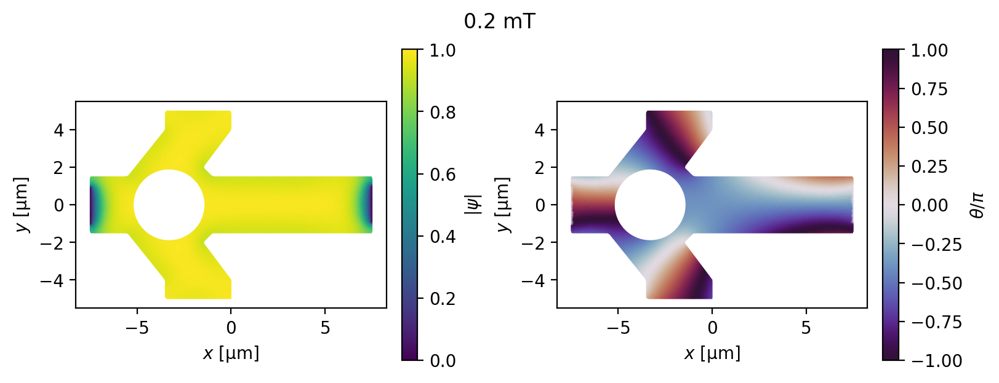

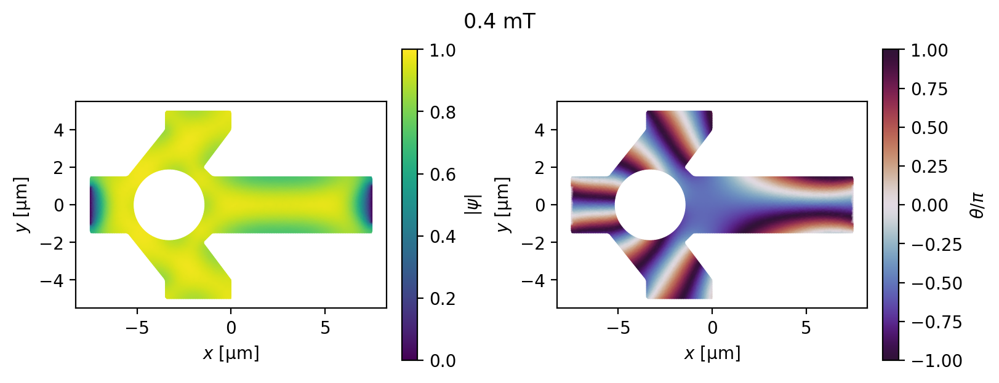

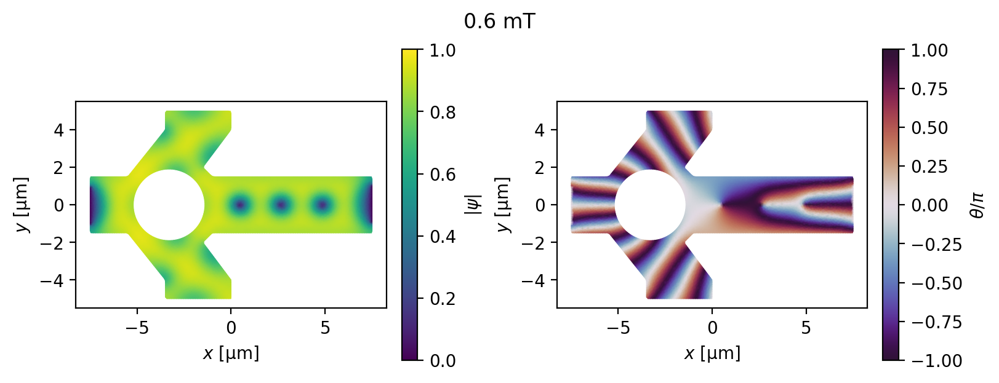

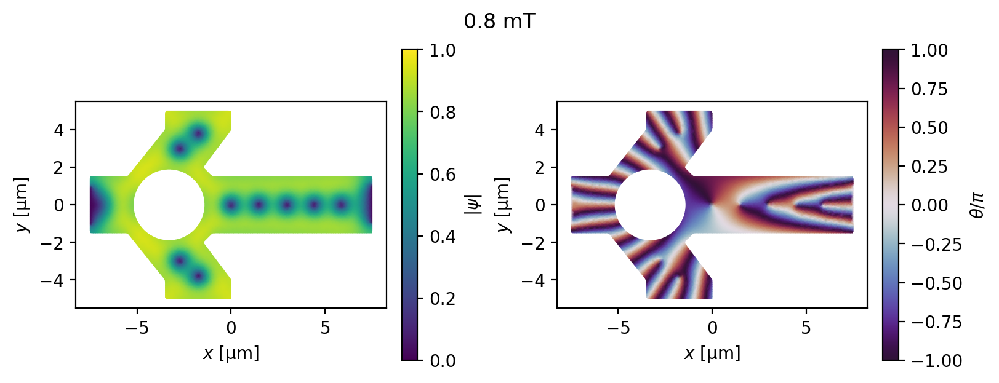

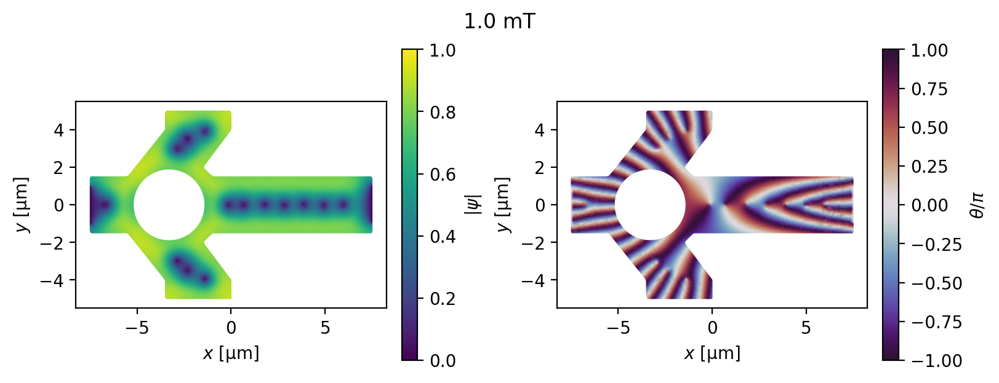

In [59]:
order_parameter_field = [0.2, 0.4, 0.6, 0.8, 1.0]
parameter_order_csv_prefix = "op_field"

with tempfile.TemporaryDirectory(dir=os.getcwd()) as tmpdir:
    order_parameter_options = options = tdgl.SolverOptions(
        solve_time=300,
        output_file=os.path.join(tmpdir, "parameter_order.h5"),
        field_units="mT", 
        current_units="uA",
    )

    seed_field = tdgl.solve(
        device=ltr_device,
        options=options,
    )

    for field in order_parameter_field:
        parameter_order_path = os.path.join(
            raw_data_path, f"{parameter_order_csv_prefix}_{order_parameter_field}_{field}.csv",
        )
        if os.path.exists(parameter_order_path):
            os.remove(parameter_order_path)
        solution = tdgl.solve(
            device=ltr_device,
            options=order_parameter_options,
            applied_vector_potential=field,
            seed_solution=seed_field,
        )

        fig, axes = tdgl.plot_order_parameter(solution)
        fig.suptitle(f"{field} mT")
        